In [1]:
#!pip install librosa

In [2]:
# Install torchaudio using pip
#!pip install -U torchaudio --no-cache-dir

In [1]:
import librosa
import numpy as np
import random
from IPython.display import display, Audio
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

import torch
import torchaudio
from torchaudio import transforms

import torch.nn.functional as F
from torch.nn import init

In [2]:
# Print the version of pytorch
print(torch.__version__)

2.4.0+cu121


In [4]:
y, sr = librosa.load('data/wav/191224_0710_00-32-39.2--00-32-40.47.wav', sr=None)

In [5]:
Audio(y, rate=sr)

Text(0.5, 1.0, 'Waveform')

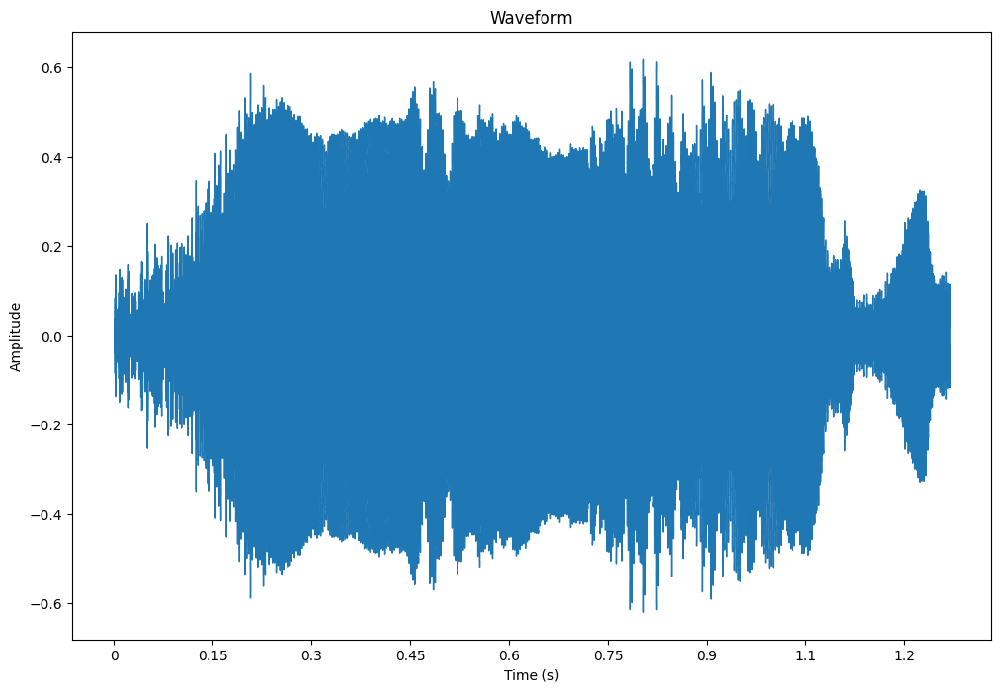

In [6]:
plt.figure(figsize=(12, 8))
librosa.display.waveshow(y, sr=sr)
# Label the axis
plt.ylabel('Amplitude')
plt.xlabel('Time (s)')
# Set the title
plt.title('Waveform')


In [7]:
print("The duration of the audio is: ", librosa.get_duration(y=y, sr=sr), "seconds")
print("The number of samples in the audio is: ", len(y))
print("The sampling rate of the audio is: ", sr, "Hz")
print("The shape of the audio is: ", y.shape)
print("The data type of the audio is: ", y.dtype)

The duration of the audio is:  1.2680045351473923 seconds
The number of samples in the audio is:  55919
The sampling rate of the audio is:  44100 Hz
The shape of the audio is:  (55919,)
The data type of the audio is:  float32


In [8]:
D = librosa.stft(y)
spectrogram = librosa.amplitude_to_db(abs(D), ref=np.max)

Text(0.5, 1.0, 'Spectrogram')

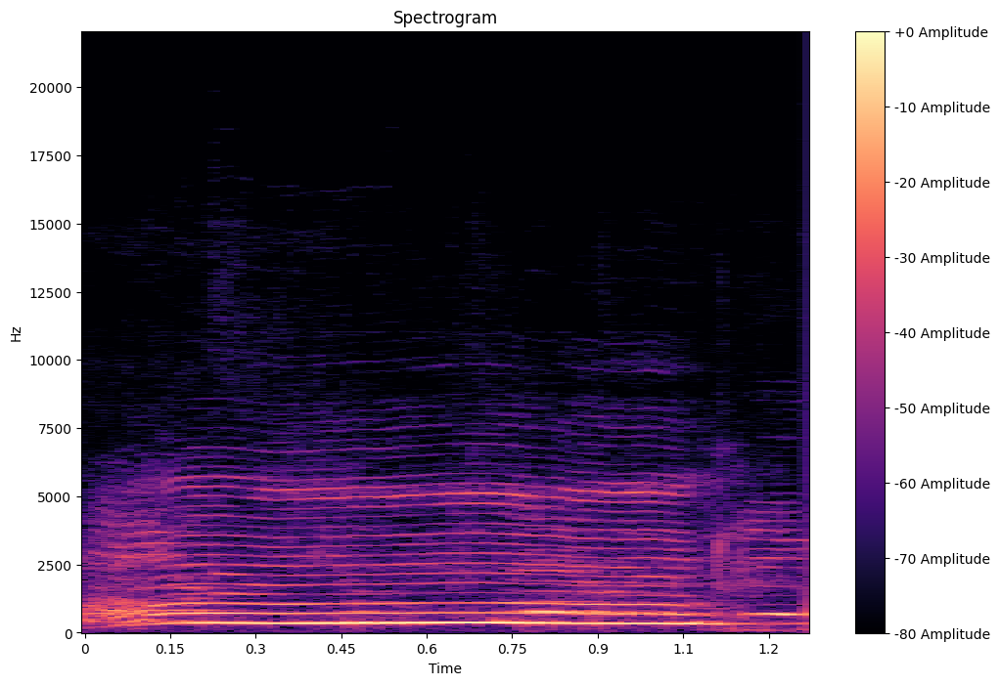

In [9]:
plt.figure(figsize=(12, 8))
librosa.display.specshow(spectrogram, sr=sr, x_axis='time', y_axis='linear')
plt.colorbar(format='%+2.0f Amplitude')
plt.title('Spectrogram')

Text(0.5, 1.0, 'Spectrogram')

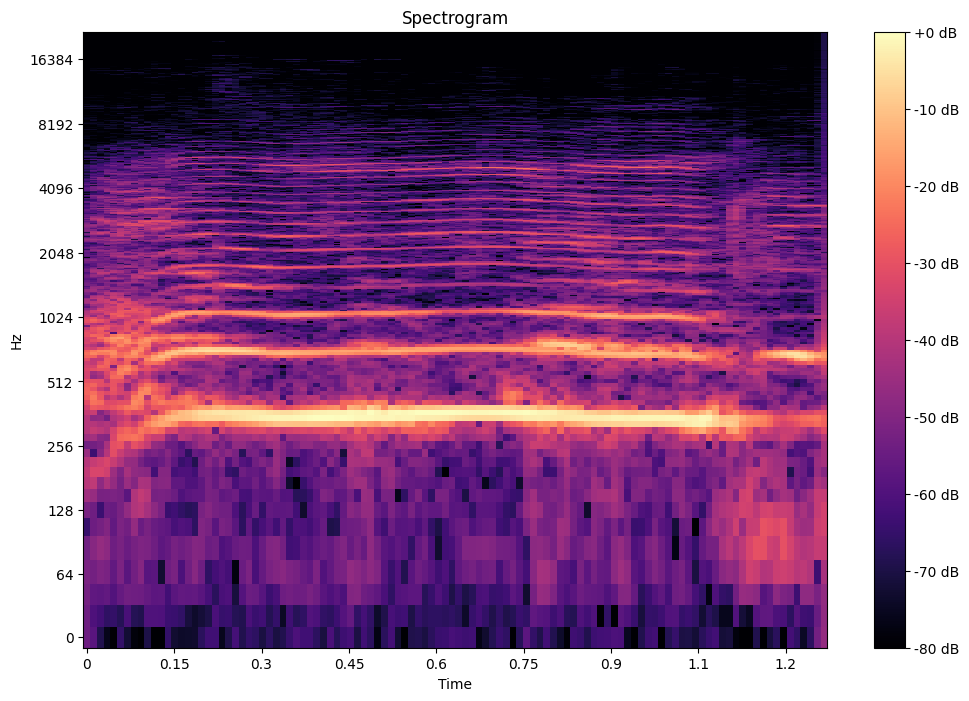

In [10]:
plt.figure(figsize=(12, 8))
librosa.display.specshow(spectrogram, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')

In [11]:
mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr)#, n_mels=128, fmin=0, fmax=sr/2)
mel_spectrogram_db = librosa.amplitude_to_db(mel_spectrogram, ref=np.max)

In [12]:
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

In [13]:
chroma = librosa.feature.chroma_stft(y=y, sr=sr, n_chroma=12)

In [14]:
zero_crossings = librosa.feature.zero_crossing_rate(y)

In [15]:
spectral_centroid = librosa.feature.spectral_centroid(y=y, sr=sr)
spectral_bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr)
spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr)
spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)

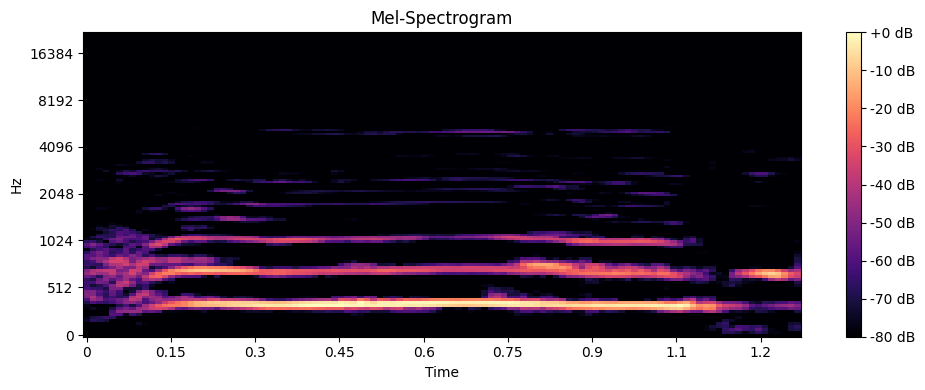

In [16]:
plt.figure(figsize=(10, 4))
librosa.display.specshow(mel_spectrogram_db, sr=sr, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel-Spectrogram')
plt.tight_layout()
plt.show()

In [17]:
print("The shape of the mel spectrogram is: ", mel_spectrogram.shape)

The shape of the mel spectrogram is:  (128, 110)


The shape of the MFCCs is:  (13, 110)


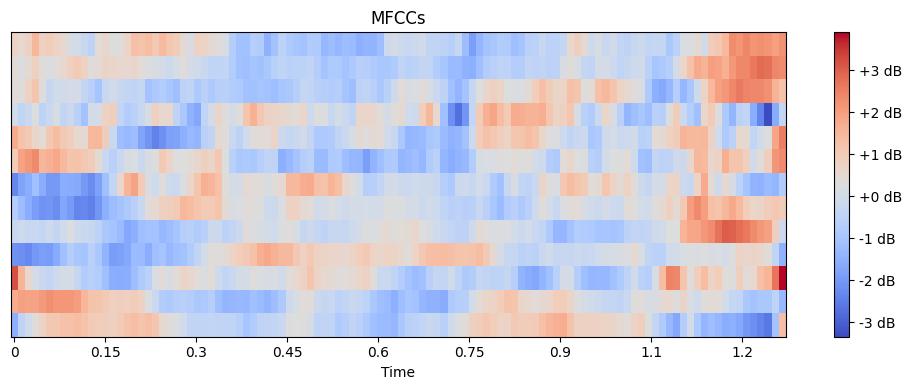

In [18]:
# Center MFCC dimensions to zero mean and unit variance
scaler = StandardScaler()
mfccs_scaled = scaler.fit_transform(mfccs.T).T

plt.figure(figsize=(10, 4))
librosa.display.specshow(mfccs_scaled, sr=sr, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('MFCC (Mean Centered, Unit Variance)')
plt.tight_layout()
plt.title('MFCCs')

print("The shape of the MFCCs is: ", mfccs.shape)

In [19]:
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=20)

The shape of the MFCCs is:  (20, 110)


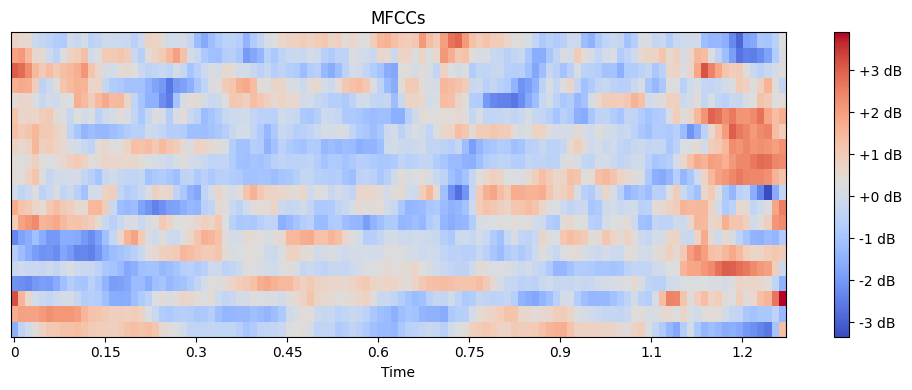

In [20]:
# Center MFCC dimensions to zero mean and unit variance
scaler = StandardScaler()
mfccs_scaled = scaler.fit_transform(mfccs.T).T

plt.figure(figsize=(10, 4))
librosa.display.specshow(mfccs_scaled, sr=sr, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('MFCC (Mean Centered, Unit Variance)')
plt.tight_layout()
plt.title('MFCCs')

print("The shape of the MFCCs is: ", mfccs.shape)

In [21]:
# Read the dataset_file_directory.csv file
df = pd.read_csv('data/dataset_file_directory.csv')

In [22]:
df.head()

,Filename,Participant,Label
0,200126_2142_00-13-04.06--00-13-04.324.wav,P01,dysregulation-sick
1,200126_2142_00-06-41.54--00-06-42.47.wav,P01,dysregulation-sick
2,200126_2142_00-11-35.94--00-11-37.08.wav,P01,dysregulation-sick
3,200126_2142_00-12-11.66--00-12-15.31.wav,P01,dysregulation-sick
4,200126_2142_00-00-24.55--00-00-24.95.wav,P01,dysregulation-sick


In [23]:
# Find the files for participant 1
p01_df = df[df['Participant'] == 'P01']

In [24]:
p01_df

,Filename,Participant,Label
0,200126_2142_00-13-04.06--00-13-04.324.wav,P01,dysregulation-sick
1,200126_2142_00-06-41.54--00-06-42.47.wav,P01,dysregulation-sick
2,200126_2142_00-11-35.94--00-11-37.08.wav,P01,dysregulation-sick
3,200126_2142_00-12-11.66--00-12-15.31.wav,P01,dysregulation-sick
4,200126_2142_00-00-24.55--00-00-24.95.wav,P01,dysregulation-sick
...,...,...,...
1703,200321_2039_00-05-12.36--00-05-13.01.wav,P01,delighted
1704,200309_2035_00-02-05.585--00-02-07.483.wav,P01,delighted
1705,200309_2035_00-02-19.13--00-02-19.69.wav,P01,delighted
1706,200309_2035_00-00-33--00-00-33.31.wav,P01,delighted


In [25]:
# Perform EDA on the P01 dataset

In [26]:
# Load all the audio files for participant 1
audio_files = []
sample_rates = []

for i in range(len(p01_df)):
    y, sr = librosa.load("data/wav/"+ p01_df['Filename'].iloc[i], sr=None)
    audio_files.append(y)
    sample_rates.append(sr)
    
# Check the duration of the audio files
durations = [librosa.get_duration(y=y, sr=sr) for y, sr in zip(audio_files, sample_rates)]

# Check the number of samples in the audio files
n_samples = [len(y) for y in audio_files]

# # Check the sampling rate of the audio files
# sampling_rates = sample_rates

# Check the shape of the audio files
shapes = [y.shape for y in audio_files]

In [27]:
# np.unique(sample_rates)
print("All recordings have the same sampling rate of" , np.unique(sample_rates)[0], "Hz")

All recordings have the same sampling rate of 44100 Hz


In [28]:
# Find if audio recordings are mono or stereo

# Check the number of channels in the audio files
n_channels = [y.ndim for y in audio_files]

In [29]:
print(np.unique(n_channels))
print("All recordings are mono")

[1]
All recordings are mono


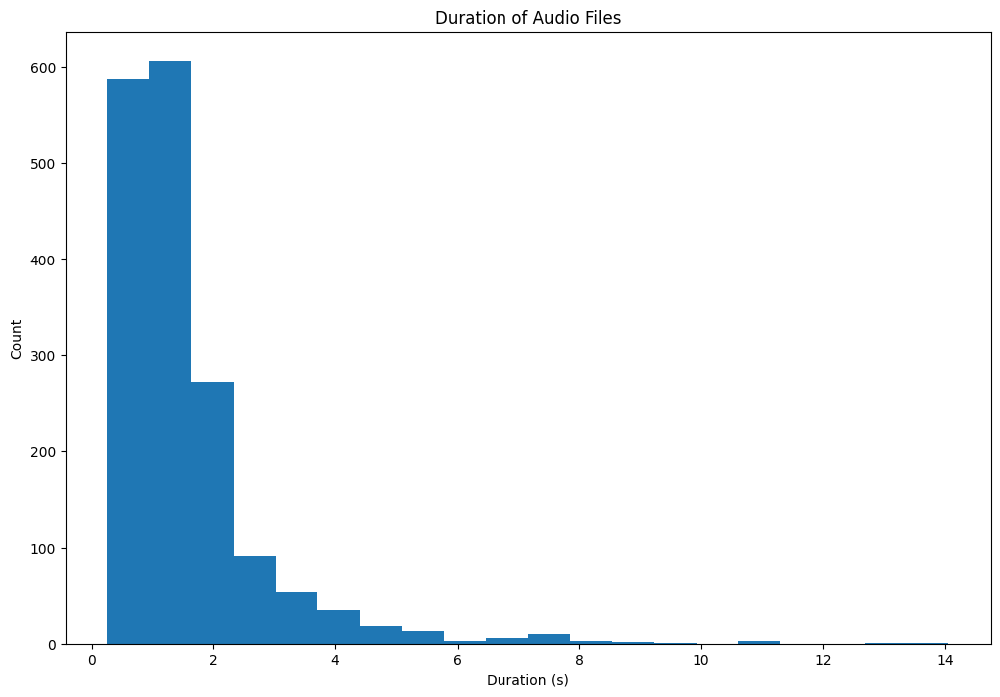

In [30]:
# Check the duration of the audio files
plt.figure(figsize=(12, 8))
plt.hist(durations, bins=20)
plt.xlabel('Duration (s)')
plt.ylabel('Count')
plt.title('Duration of Audio Files')
plt.show()

In [31]:
print("The total number of recordings of participant 1 is: ", len(audio_files))
print("The duration of the shortest recording is: ", min(durations), "seconds")
print("The duration of the longest recording is: ", max(durations), "seconds")
print("The average duration of the recordings is: ", np.mean(durations), "seconds")
print("The median duration of the recordings is: ", np.median(durations), "seconds")

The total number of recordings of participant 1 is:  1708
The duration of the shortest recording is:  0.2639909297052154 seconds
The duration of the longest recording is:  14.057006802721089 seconds
The average duration of the recordings is:  1.5445674085403092 seconds
The median duration of the recordings is:  1.2269954648526076 seconds


In [32]:
# Check the unique labels in the dataset
unique_labels = df['Label'].unique()

In [33]:
print("The unique labels in the dataset are: ", unique_labels)

The unique labels in the dataset are:  ['dysregulation-sick' 'frustrated' 'bathroom' 'dysregulated' 'social'
 'selftalk' 'dysregulation-bathroom' 'request' 'glee' 'delighted'
 'laughter' 'affectionate' 'protest' 'laugh' 'happy' 'hunger' 'help' 'yes'
 'tablet' 'more' 'greeting' 'no']


In [34]:
df.Participant.unique()

array(['P01', 'P02', 'P03', 'P05', 'P06', 'P08', 'P11', 'P16'],
      dtype=object)

In [35]:
# Get the number of recordings for each participant
df['Participant'].value_counts()

Participant
P01    1708
P08    1545
P05    1028
P16     779
P06     569
P02     557
P03     525
P11     366
Name: count, dtype: int64

In [36]:
Audio(audio_files[2], rate=sample_rates[0])

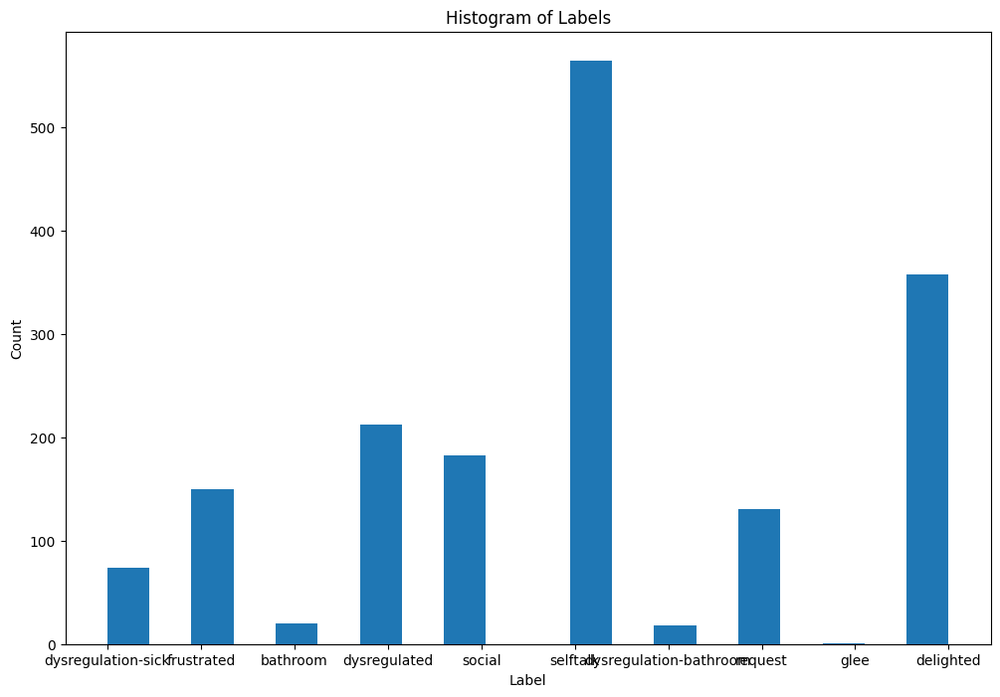

In [37]:
# Make a histogram of the labels in the dataset for participant 1

# Get the labels for participant 1
labels = p01_df['Label']

# Make a histogram of the labels
plt.figure(figsize=(12, 8))
plt.hist(labels, bins=20)
plt.xlabel('Label')
plt.ylabel('Count')
plt.title('Histogram of Labels')
plt.show()

In [38]:
np.unique(labels)

array(['bathroom', 'delighted', 'dysregulated', 'dysregulation-bathroom',
       'dysregulation-sick', 'frustrated', 'glee', 'request', 'selftalk',
       'social'], dtype=object)

In [39]:
# # Convert the labels to integers by one-hot encoding using get_dummies
# one_hot_labels = pd.get_dummies(labels)

# one_hot_labels.head()

In [40]:
# # Make the train and test split for the dataset

# from sklearn.model_selection import train_test_split

# X_train, X_test, y_train, y_test = train_test_split(audio_files.copy(), one_hot_labels, test_size=0.2, random_state=42, shuffle=True, stratify=one_hot_labels)

In [41]:
# Since, a few classes have very few samples, we will collate similar classes together
# First, find the classes with very few samples by getting the count of each class in ascending order
labels.value_counts()

Label
selftalk                  564
delighted                 357
dysregulated              212
social                    182
frustrated                150
request                   130
dysregulation-sick         74
bathroom                   20
dysregulation-bathroom     18
glee                        1
Name: count, dtype: int64

In [42]:
# Club together glee with delighted, all dysregulation and bathroom with dysregulated

p01_df['Label'] = p01_df['Label'].replace({'glee': 'delighted', 'dysregulation-bathroom': 'dysregulated', 'bathroom': 'dysregulated', 'dysregulation-sick': 'dysregulated'})

/tmp/ipykernel_22882/1558284575.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p01_df['Label'] = p01_df['Label'].replace({'glee': 'delighted', 'dysregulation-bathroom': 'dysregulated', 'bathroom': 'dysregulated', 'dysregulation-sick': 'dysregulated'})


In [43]:
p01_df['Label'].value_counts()

Label
selftalk        564
delighted       358
dysregulated    324
social          182
frustrated      150
request         130
Name: count, dtype: int64

In [44]:
p01_df

,Filename,Participant,Label
0,200126_2142_00-13-04.06--00-13-04.324.wav,P01,dysregulated
1,200126_2142_00-06-41.54--00-06-42.47.wav,P01,dysregulated
2,200126_2142_00-11-35.94--00-11-37.08.wav,P01,dysregulated
3,200126_2142_00-12-11.66--00-12-15.31.wav,P01,dysregulated
4,200126_2142_00-00-24.55--00-00-24.95.wav,P01,dysregulated
...,...,...,...
1703,200321_2039_00-05-12.36--00-05-13.01.wav,P01,delighted
1704,200309_2035_00-02-05.585--00-02-07.483.wav,P01,delighted
1705,200309_2035_00-02-19.13--00-02-19.69.wav,P01,delighted
1706,200309_2035_00-00-33--00-00-33.31.wav,P01,delighted


In [45]:
# Modify the dataframe to load the audio files with the new labels for participant 1 and perform the same EDA

# Load all the audio files for participant 1
audio_files = []
# sample_rates = [] # No need to load the sample rates as they are all the same

for i in range(len(p01_df)):
    y, sr = librosa.load("data/wav/"+ p01_df['Filename'].iloc[i], sr=None)
    audio_files.append(y)
    # sample_rates.append(sr)
    
# Add the audio files and sample rates to the dataframe

p01_df['Audio'] = audio_files
# p01_df['Sample Rate'] = sample_rates

p01_df.head()

/tmp/ipykernel_22882/299638320.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p01_df['Audio'] = audio_files


,Filename,Participant,Label,Audio
0,200126_2142_00-13-04.06--00-13-04.324.wav,P01,dysregulated,"[-0.14604187, -0.15263367, -0.15974426, -0.168..."
1,200126_2142_00-06-41.54--00-06-42.47.wav,P01,dysregulated,"[0.08834839, 0.09138489, 0.09321594, 0.0956726..."
2,200126_2142_00-11-35.94--00-11-37.08.wav,P01,dysregulated,"[0.035842896, 0.024032593, 0.011581421, -0.000..."
3,200126_2142_00-12-11.66--00-12-15.31.wav,P01,dysregulated,"[0.0067596436, -0.00045776367, -0.010925293, -..."
4,200126_2142_00-00-24.55--00-00-24.95.wav,P01,dysregulated,"[0.028396606, 0.027648926, 0.024993896, 0.0185..."


In [46]:
sample_rate = sample_rates[0]

In [47]:
# One hot encode the labels for participant 1 and add them to the dataframe
one_hot_labels = pd.get_dummies(p01_df['Label'])
p01_df = pd.concat([p01_df, one_hot_labels], axis=1)

p01_df.head()

,Filename,Participant,Label,Audio,delighted,dysregulated,frustrated,request,selftalk,social
0,200126_2142_00-13-04.06--00-13-04.324.wav,P01,dysregulated,"[-0.14604187, -0.15263367, -0.15974426, -0.168...",False,True,False,False,False,False
1,200126_2142_00-06-41.54--00-06-42.47.wav,P01,dysregulated,"[0.08834839, 0.09138489, 0.09321594, 0.0956726...",False,True,False,False,False,False
2,200126_2142_00-11-35.94--00-11-37.08.wav,P01,dysregulated,"[0.035842896, 0.024032593, 0.011581421, -0.000...",False,True,False,False,False,False
3,200126_2142_00-12-11.66--00-12-15.31.wav,P01,dysregulated,"[0.0067596436, -0.00045776367, -0.010925293, -...",False,True,False,False,False,False
4,200126_2142_00-00-24.55--00-00-24.95.wav,P01,dysregulated,"[0.028396606, 0.027648926, 0.024993896, 0.0185...",False,True,False,False,False,False


In [48]:
p01_df.sample(10)

,Filename,Participant,Label,Audio,delighted,dysregulated,frustrated,request,selftalk,social
1403,200307_1850_00-01-49.66--00-01-50.01.wav,P01,delighted,"[0.0056152344, 0.0064849854, 0.006011963, 0.00...",True,False,False,False,False,False
197,200302_2156_00-02-22.65--00-02-23.29.wav,P01,frustrated,"[-0.058807373, -0.057296753, -0.055252075, -0....",False,False,True,False,False,False
248,200316_1751_00-07-31.75--00-07-32.37.wav,P01,dysregulated,"[0.0027313232, 0.0024261475, 0.0025177002, 0.0...",False,True,False,False,False,False
1389,200307_1826_00-06-05.783--00-06-06.539.wav,P01,delighted,"[-0.0029144287, -0.0016784668, -0.00016784668,...",True,False,False,False,False,False
358,200316_1751_00-03-32.62--00-03-34.88.wav,P01,dysregulated,"[0.027389526, 0.027114868, 0.029510498, 0.0309...",False,True,False,False,False,False
43,200126_2142_00-15-20.78--00-15-21.83.wav,P01,dysregulated,"[0.0002593994, -6.1035156e-05, -0.00032043457,...",False,True,False,False,False,False
461,200506_2110_00-02-49.16--00-02-50.32.wav,P01,social,"[0.0005493164, 0.01083374, 0.01876831, 0.02322...",False,False,False,False,False,True
369,200316_1751_00-03-21.09--00-03-21.93.wav,P01,dysregulated,"[0.022628784, 0.021621704, 0.020202637, 0.0188...",False,True,False,False,False,False
826,200229_2244_00-03-50.63--00-03-52.28.wav,P01,selftalk,"[-0.031234741, -0.028045654, -0.025177002, -0....",False,False,False,False,True,False
1221,200307_2145_00-04-59.75--00-05-04.739.wav,P01,request,"[-0.012435913, -0.009216309, -0.0028686523, 0....",False,False,False,True,False,False


In [50]:
p01_df

,Filename,Participant,Label,Audio,delighted,dysregulated,frustrated,request,selftalk,social
0,200126_2142_00-13-04.06--00-13-04.324.wav,P01,dysregulated,"[-0.14604187, -0.15263367, -0.15974426, -0.168...",False,True,False,False,False,False
1,200126_2142_00-06-41.54--00-06-42.47.wav,P01,dysregulated,"[0.08834839, 0.09138489, 0.09321594, 0.0956726...",False,True,False,False,False,False
2,200126_2142_00-11-35.94--00-11-37.08.wav,P01,dysregulated,"[0.035842896, 0.024032593, 0.011581421, -0.000...",False,True,False,False,False,False
3,200126_2142_00-12-11.66--00-12-15.31.wav,P01,dysregulated,"[0.0067596436, -0.00045776367, -0.010925293, -...",False,True,False,False,False,False
4,200126_2142_00-00-24.55--00-00-24.95.wav,P01,dysregulated,"[0.028396606, 0.027648926, 0.024993896, 0.0185...",False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
1703,200321_2039_00-05-12.36--00-05-13.01.wav,P01,delighted,"[-0.002166748, 0.0004272461, 0.0032806396, 0.0...",True,False,False,False,False,False
1704,200309_2035_00-02-05.585--00-02-07.483.wav,P01,delighted,"[-0.019699097, -0.019744873, -0.019729614, -0....",True,False,False,False,False,False
1705,200309_2035_00-02-19.13--00-02-19.69.wav,P01,delighted,"[0.00018310547, 0.0002746582, 0.00076293945, 0...",True,False,False,False,False,False
1706,200309_2035_00-00-33--00-00-33.31.wav,P01,delighted,"[0.0, 0.0010375977, 0.002029419, 0.002532959, ...",True,False,False,False,False,False


In [54]:
# Save the dataframe to a csv file
p01_df.to_csv('data/p01_df.csv', index=False) # Index is set to False to avoid saving the index column

In [5]:
p01_df = pd.read_csv('data/p01_df.csv')

In [6]:
# Load an audio file and return the signal as a tensor and the sample rate
signal, sample_rate = torchaudio.load('data/wav/' + p01_df['Filename'].iloc[0])

In [5]:
signal

tensor([[-0.1637, -0.1676, -0.1750,  ...,  0.0085,  0.0076,  0.0070],
        [-0.1284, -0.1376, -0.1444,  ...,  0.0056,  0.0053,  0.0050]])

In [7]:
durations = []

for i in range(len(p01_df)):
    signal, sample_rate = torchaudio.load('data/wav/' + p01_df['Filename'].iloc[i])
    durations.append(signal.size(1) / sample_rate)
    
# Find the maximum length in milliseconds of the audio files
max_length = max(durations)

print("The maximum length of the audio files is: ", max_length, "seconds")

The maximum length of the audio files is:  14.057006802721089 seconds


In [8]:
# Find the maximum length in samples
max_length_samples = int(max_length * sample_rate)

In [9]:
signal.shape

torch.Size([2, 25269])

In [10]:
# Instead, define a function to pad the signal to the maximum length

def pad_signal(signal, max_length_samples):
    if signal.shape[1] < max_length_samples:
        pad_begin_len = random.randint(0, max_length_samples - signal.shape[1]) # Begin padding length can be anything between 0 and the difference between the max length and the signal length
        pad_end_len = max_length_samples - signal.shape[1] - pad_begin_len  # End padding length is the difference between the max length and the sum of the signal length and the begin padding length

        # Pad with zeros
        pad_begin = torch.zeros(signal.shape[0], pad_begin_len)
        pad_end = torch.zeros(signal.shape[0], pad_end_len)

        signal = torch.cat((pad_begin, signal, pad_end), 1)
        
    return signal

In [11]:
# Define a function to shift the signal in time by a random amount between -0.5 and 0.5 seconds

def shift_signal(signal, sample_rate):
    shift_amount = random.uniform(-0.5, 0.5)
    shift_samples = int(shift_amount * sample_rate) # Convert the shift amount to samples
    
    if shift_samples > 0:
        # Shift the signal to the right
        signal = torch.cat((torch.zeros(signal.shape[0], shift_samples), signal[:, :-shift_samples]), 1)
    else:
        # Shift the signal to the left
        signal = torch.cat((signal[:, -shift_samples:], torch.zeros(signal.shape[0], -shift_samples)), 1)
        
    return signal

In [12]:
# Define a function to generate mel spectrograms from the audio files

def generate_mel_spectrogram(signal, sample_rate, n_mels=128, fmin=0, fmax=None, n_fft=2048):
    mel_spectrogram = torchaudio.transforms.MelSpectrogram(sample_rate=sample_rate, n_mels=n_mels, f_min=fmin, f_max=fmax, n_fft=n_fft)(signal)
    mel_spectrogram_db = torchaudio.transforms.AmplitudeToDB()(mel_spectrogram)
    
    return mel_spectrogram

In [13]:
# Define a function to do time and frequency masking on the mel spectrogram

def mask_mel_spectrogram(mel_spectrogram, max_mask_pct=0.1, n_freq_masks=1, n_time_masks=1):
    n_mel_channels = mel_spectrogram.shape[1] # Number of mel channels
    n_mel_frames = mel_spectrogram.shape[2] # Number of mel frames
    
    max_mask_size_freq = int(max_mask_pct * n_mel_channels) # Maximum size of the frequency mask
    max_mask_size_time = int(max_mask_pct * n_mel_frames) # Maximum size of the time mask
    
    for _ in range(n_freq_masks):
        mask_size_freq = random.randint(0, max_mask_size_freq) # Random size of the frequency mask
        mask_start_freq = random.randint(0, n_mel_channels - mask_size_freq) # Random start of the frequency mask
        mel_spectrogram[:, mask_start_freq:mask_start_freq + mask_size_freq, :] = 0 
        
    for _ in range(n_time_masks):
        mask_size_time = random.randint(0, max_mask_size_time) # Random size of the time mask
        mask_start_time = random.randint(0, n_mel_frames - mask_size_time) # Random start of the time mask
        mel_spectrogram[:, :, mask_start_time:mask_start_time + mask_size_time] = 0
        
    return mel_spectrogram

In [22]:
# Define a function to augment the audio files

def augment_audio_files(audio_files, max_length_samples, sample_rate, n_mels=128, fmin=0, fmax=None, n_fft=2048, max_mask_pct=0.1, n_freq_masks=1, n_time_masks=1):
    mel_spectrograms = []
    augmented_audio_files = [] # To store the augmented audio files
    
    for i in range(len(audio_files)):
        signal = torch.tensor(audio_files[i])
        signal = pad_signal(signal, max_length_samples)
        signal = shift_signal(signal, sample_rate)
        
        augmented_audio_files.append(signal.numpy()) # Append the augmented audio file
        
        mel_spectrogram = generate_mel_spectrogram(signal, sample_rate, n_mels, fmin, fmax, n_fft)
        mel_spectrogram = mask_mel_spectrogram(mel_spectrogram, max_mask_pct, n_freq_masks, n_time_masks)
        mel_spectrograms.append(mel_spectrogram)
        
    return mel_spectrograms, augmented_audio_files

In [23]:
# Augment the audio files

audio_files = [] # List to store the audio files because apprently, csv files don't store the audio files as tensors
for i in range(len(p01_df)):
    signal, sample_rate = torchaudio.load('data/wav/' + p01_df['Filename'].iloc[i])
    audio_files.append(signal)
sample_rate = librosa.load('data/wav/' + p01_df['Filename'].iloc[0], sr=None)[1]
mel_spectrograms, augmented_signals = augment_audio_files(audio_files, max_length_samples, sample_rate)

/tmp/ipykernel_5492/2100015310.py:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  signal = torch.tensor(audio_files[i])


The label of the audio file is:  delighted


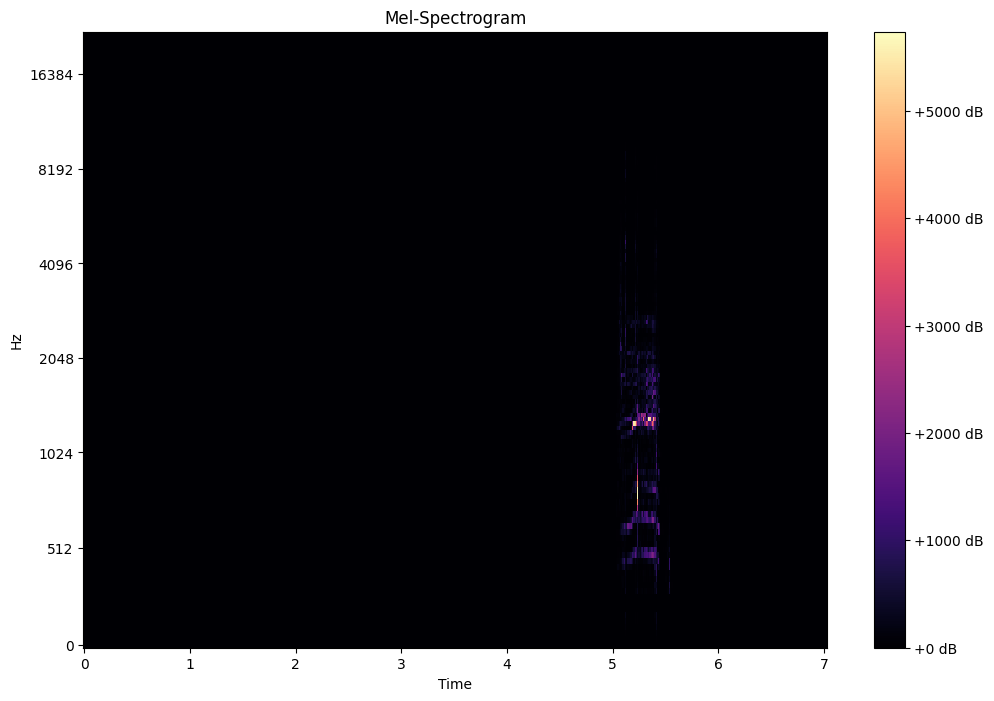

The label of the audio file is:  selftalk


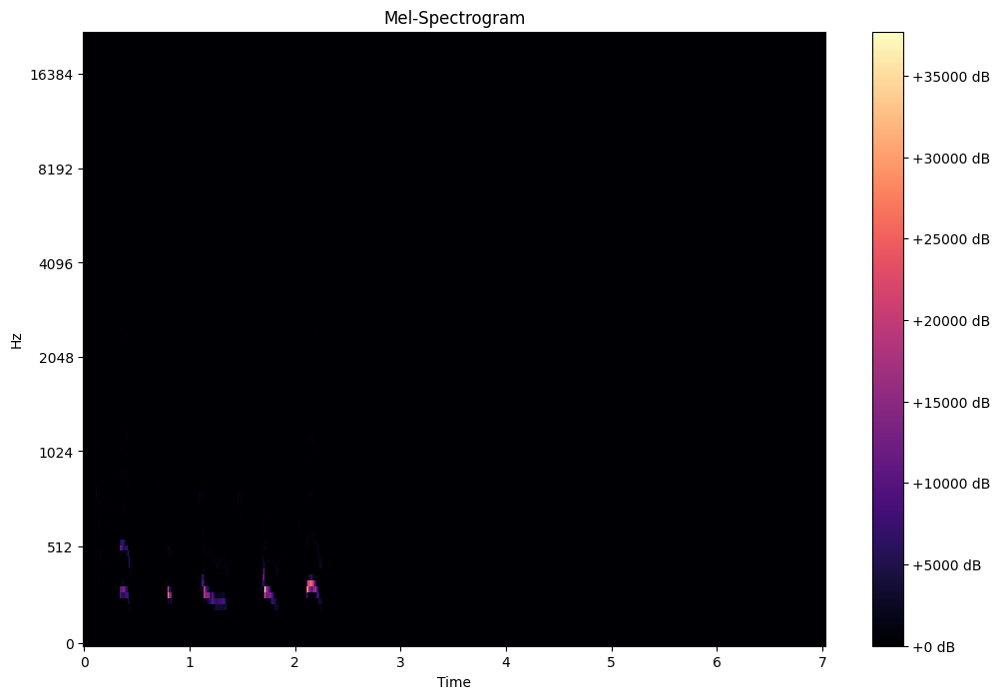

The label of the audio file is:  selftalk


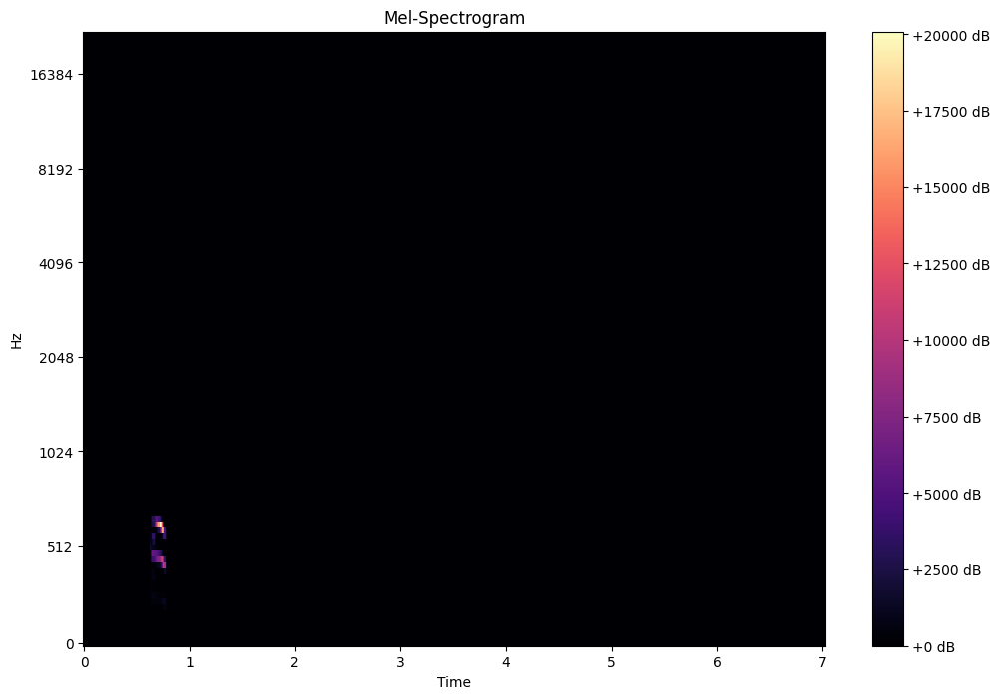

The label of the audio file is:  frustrated


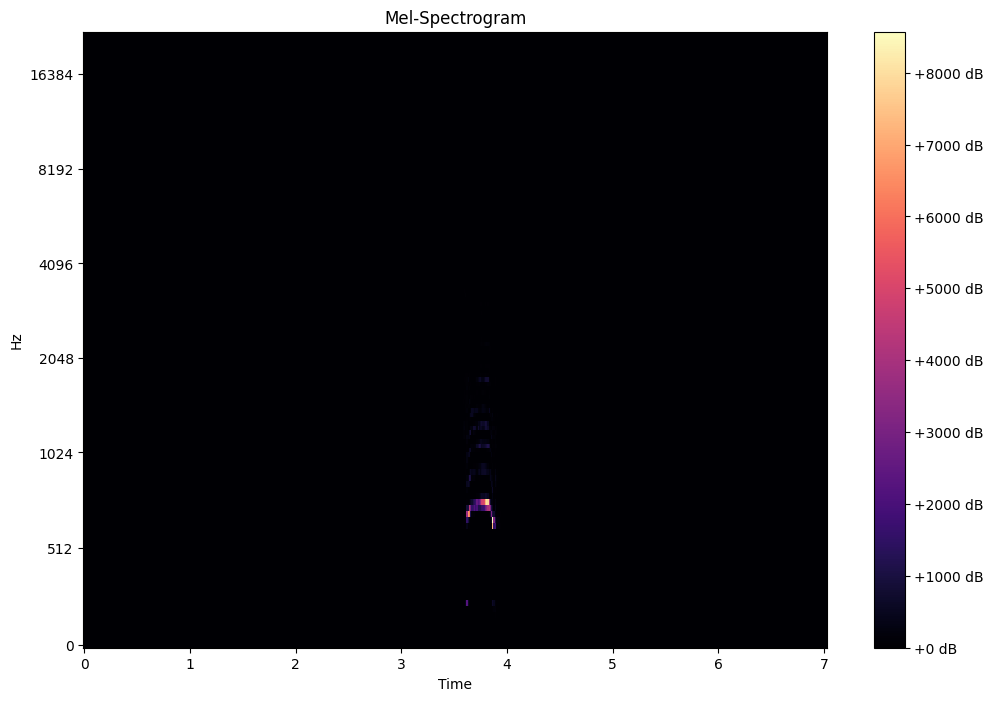

The label of the audio file is:  request


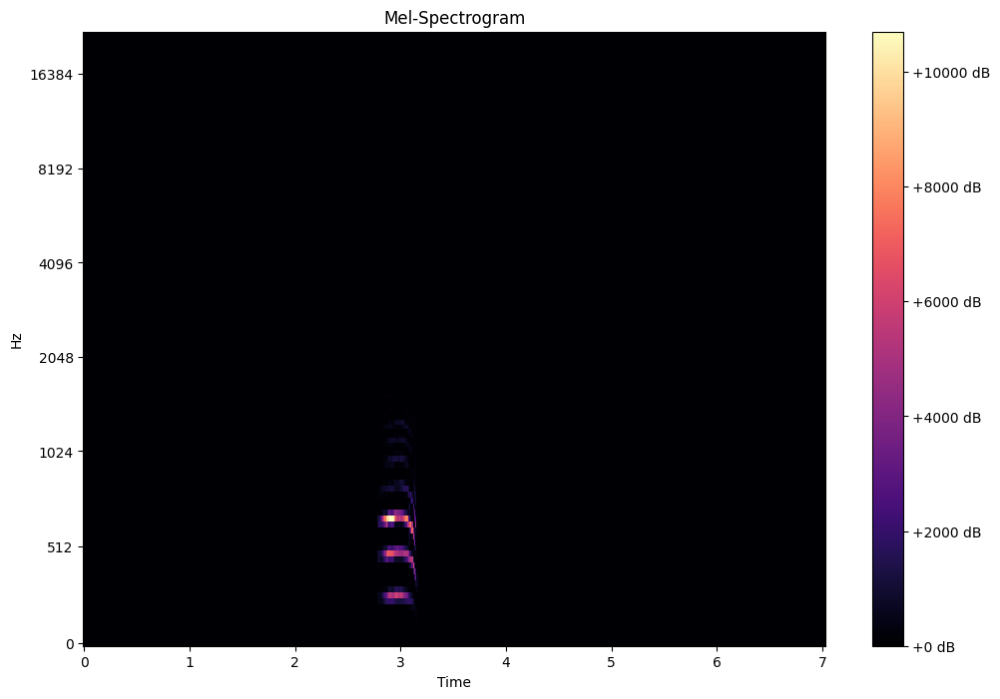

In [24]:
# Plot 5 random mel spectrograms using librosa
# plt.figure(figsize=(12, 8))
# for i in range(5):
#     plt.subplot(5, 1, i+1)
#     librosa.display.specshow(mel_spectrograms[random.randint(0, len(mel_spectrograms))][0].numpy(), sr=sample_rate, x_axis='time', y_axis='mel')
#     plt.colorbar(format='%+2.0f dB')
#     plt.title('Mel-Spectrogram')

# plt.tight_layout()

# Play the audio file and display the mel spectrogram for 5 random samples using librosa

ran_samps = random.sample(range(len(p01_df)), 5)

for i in ran_samps:
    print("The label of the audio file is: ", p01_df['Label'].iloc[i])
    plt.figure(figsize=(12, 8))
    librosa.display.specshow(mel_spectrograms[i][0].numpy(), sr=sample_rate, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel-Spectrogram')
    plt.show()

In [25]:
# Listen to the audio files for the 5 random samples

for i in ran_samps:
    print("The label of the audio file is: ", p01_df['Label'].iloc[i])
    display(Audio(audio_files[i], rate=sample_rate))

The label of the audio file is:  delighted


The label of the audio file is:  selftalk


The label of the audio file is:  selftalk


The label of the audio file is:  frustrated


The label of the audio file is:  request


In [26]:
# Listen to the augmented audio files for the 5 random samples

for i in ran_samps:
    print("The label of the audio file is: ", p01_df['Label'].iloc[i])
    display(Audio(augmented_signals[i], rate=sample_rate))

The label of the audio file is:  delighted


The label of the audio file is:  selftalk


The label of the audio file is:  selftalk


The label of the audio file is:  frustrated


The label of the audio file is:  request


In [27]:
# Create a 80:20 train and test split for the dataset for participant 1 using the augmented audio files and mel spectrograms

# Add the mel spectrograms and augmented audio files to the dataframe
p01_df['Mel Spectrogram'] = mel_spectrograms
p01_df['Augmented Audio'] = augmented_signals

# Save the dataframe to a csv file
p01_df.to_csv('data/p01_df_augmented.csv', index=False) # Index is set to False to avoid saving the index column

# Make the train and test split for the dataset

X_train, X_test, y_train, y_test = train_test_split(p01_df[['Augmented Audio', 'Mel Spectrogram']], p01_df.drop(['Augmented Audio', 'Mel Spectrogram'], axis=1), test_size=0.2, random_state=42, shuffle=True, stratify=p01_df['Label'])
# Stratify the split based on the labels and not the one-hot encoded labels as the one-hot encoded labels are not present in the dataframe anymore and drop the augmented audio and mel spectrogram columns from the x dataframes as they are not needed

In [30]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1366, 2), (342, 2), (1366, 10), (342, 10))

In [32]:
X_test

,Augmented Audio,Mel Spectrogram
1186,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[[tensor(0.), tensor(0.), tensor(0.), tensor(..."
1626,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[[tensor(0.), tensor(0.), tensor(0.), tensor(..."
1059,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[[tensor(0.), tensor(0.), tensor(0.), tensor(..."
866,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[[tensor(0.), tensor(0.), tensor(0.), tensor(..."
990,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[[tensor(0.), tensor(0.), tensor(0.), tensor(..."
...,...,...
1677,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[[tensor(0.), tensor(0.), tensor(0.), tensor(..."
1707,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[[tensor(0.), tensor(0.), tensor(0.), tensor(..."
1194,"[[0.1315918, 0.13076782, 0.13079834, 0.1318664...","[[[tensor(107.1457), tensor(0.0058), tensor(0...."
1693,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[[tensor(0.), tensor(0.), tensor(0.), tensor(..."


In [33]:
y_test

,Filename,Participant,Label,Audio,delighted,dysregulated,frustrated,request,selftalk,social
1186,200329_1113_00-13-38.86--00-13-39.94.wav,P01,selftalk,[ 0.0186615 0.00944519 0.0038147 ... -0.01...,False,False,False,False,True,False
1626,200309_2035_00-05-10.63--00-05-11.91.wav,P01,delighted,[-0.00149536 -0.00054932 -0.00024414 ... -0.00...,True,False,False,False,False,False
1059,200229_2244_00-05-22.03--00-05-23.17.wav,P01,selftalk,[-0.03457642 -0.03807068 -0.04052734 ... 0.00...,False,False,False,False,True,False
866,200306_2024_00-03-20.26--00-03-20.91.wav,P01,selftalk,[ 0.01483154 0.01954651 0.02474976 ... 0.00...,False,False,False,False,True,False
990,200306_2024_00-17-31.11--00-17-31.68.wav,P01,selftalk,[ 0.11328125 0.10844421 0.1025238 ... -0.01...,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...
1677,200815_2140_00-00-15.88--00-00-18.55.wav,P01,delighted,[ 0.00408936 0.0065918 0.01071167 ... -0.03...,True,False,False,False,False,False
1707,200307_1826_00-05-53.14--00-05-53.71.wav,P01,delighted,[ 0.00387573 0.0035553 0.00352478 ... -0.00...,True,False,False,False,False,False
1194,200306_2024_00-08-21.67--00-08-24.98.wav,P01,selftalk,[-0.01591492 -0.01504517 -0.01268005 ... -0.00...,False,False,False,False,True,False
1693,200529_1029_00-01-10.01--00-01-11.35.wav,P01,delighted,[-6.1035156e-04 -3.0517578e-05 9.1552734e-04 ...,True,False,False,False,False,False


In [34]:
X_train['Mel Spectrogram']

348     [[[tensor(0.), tensor(0.), tensor(0.), tensor(...
85      [[[tensor(0.), tensor(0.), tensor(0.), tensor(...
1526    [[[tensor(0.), tensor(0.), tensor(0.), tensor(...
393     [[[tensor(0.), tensor(0.), tensor(0.), tensor(...
1080    [[[tensor(0.), tensor(0.), tensor(0.), tensor(...
                              ...                        
1146    [[[tensor(0.), tensor(0.), tensor(0.), tensor(...
1433    [[[tensor(0.), tensor(0.), tensor(0.), tensor(...
401     [[[tensor(0.), tensor(0.), tensor(0.), tensor(...
629     [[[tensor(0.), tensor(0.), tensor(0.), tensor(...
949     [[[tensor(0.), tensor(0.), tensor(0.), tensor(...
Name: Mel Spectrogram, Length: 1366, dtype: object

In [35]:
check_train_mels = torch.stack([torch.tensor(ms) for ms in X_train['Mel Spectrogram']]).squeeze(1)

/tmp/ipykernel_5492/3210524213.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  check_train_mels = torch.stack([torch.tensor(ms) for ms in X_train['Mel Spectrogram']]).squeeze(1)


RuntimeError: stack expects each tensor to be equal size, but got [2, 128, 606] at entry 0 and [1, 128, 606] at entry 6

In [36]:
train_dataset_check = torch.utils.data.TensorDataset(X_train['Mel Spectrogram'].unsqueeze(1), torch.tensor(y_train.values).long())

AttributeError: 'Series' object has no attribute 'unsqueeze'

In [37]:
train_mels_check = torch.stack([torch.tensor(ms).unsqueeze(0) for ms in X_train['Mel Spectrogram']])

/tmp/ipykernel_5492/1797679488.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  train_mels_check = torch.stack([torch.tensor(ms).unsqueeze(0) for ms in X_train['Mel Spectrogram']])


RuntimeError: stack expects each tensor to be equal size, but got [1, 2, 128, 606] at entry 0 and [1, 1, 128, 606] at entry 6

In [38]:
for i, signal in enumerate(audio_files):
    print(f"Signal {i}: Shape {signal.shape}")

Signal 0: Shape torch.Size([2, 11642])
Signal 1: Shape torch.Size([2, 41101])
Signal 2: Shape torch.Size([2, 50494])
Signal 3: Shape torch.Size([2, 160876])
Signal 4: Shape torch.Size([2, 17904])
Signal 5: Shape torch.Size([2, 56227])
Signal 6: Shape torch.Size([2, 20947])
Signal 7: Shape torch.Size([2, 42733])
Signal 8: Shape torch.Size([2, 21168])
Signal 9: Shape torch.Size([2, 95345])
Signal 10: Shape torch.Size([2, 68928])
Signal 11: Shape torch.Size([2, 68751])
Signal 12: Shape torch.Size([2, 29327])
Signal 13: Shape torch.Size([2, 44586])
Signal 14: Shape torch.Size([2, 30165])
Signal 15: Shape torch.Size([2, 66811])
Signal 16: Shape torch.Size([2, 77571])
Signal 17: Shape torch.Size([2, 208637])
Signal 18: Shape torch.Size([2, 56272])
Signal 19: Shape torch.Size([2, 99313])
Signal 20: Shape torch.Size([2, 24343])
Signal 21: Shape torch.Size([2, 14112])
Signal 22: Shape torch.Size([2, 85951])
Signal 23: Shape torch.Size([2, 51862])
Signal 24: Shape torch.Size([2, 58520])
Signal 2

In [ ]:
check_train_mels.shape

In [ ]:
check_train_mels[0]

In [ ]:
# Define the audio classification model

class AudioClassifier(torch.nn.Module):
    
    def __init__(self, n_classes, n_mels=128):
        super(AudioClassifier, self).__init__() # Initialize the parent class
        
        self.conv1 = torch.nn.Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)) # 1 input channel, 32 output channels, 3x3 kernel, 1x1 stride, 1x1 padding
        self.conv2 = torch.nn.Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)) # 32 input channels, 64 output channels, 3x3 kernel, 1x1 stride, 1x1 padding
        self.conv3 = torch.nn.Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)) # 64 input channels, 128 output channels, 3x3 kernel, 1x1 stride, 1x1 padding
        self.conv4 = torch.nn.Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)) # 128 input channels, 256 output channels, 3x3 kernel, 1x1 stride, 1x1 padding
        
        self.pool = torch.nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0) # Reduce the size of the input by half in both dimensions using max pooling with a 2x2 kernel window and stride
        
        self.fc1 = torch.nn.Linear(256 * (n_mels // 16), 512) # fully connected layer: takes in the flattened output of the last convolutional layer and outputs 512 features with dimensions reduced by a factor of 16
        self.fc2 = torch.nn.Linear(512, n_classes) # fully connected layer: takes in the 512 features from the previous layer and outputs the number of classes
        
        self.dropout = torch.nn.Dropout(0.5) # Dropout layer with a dropout rate of 0.5
        
    def forward(self, x):
        x = F.relu(self.conv1(x)) # Apply ReLU activation function to the output of the first convolutional layer
        x = self.pool(x) # Apply max pooling to the output of the first convolutional layer
        
        x = F.relu(self.conv2(x)) # Repeat the same process for the next convolutional layer
        x = self.pool(x)
        
        x = F.relu(self.conv3(x)) 
        x = self.pool(x)
        
        x = F.relu(self.conv4(x))
        x = self.pool(x)
        
        x = x.view(x.size(0), -1) # Flatten the output of the last convolutional layer
        
        x = F.relu(self.fc1(x)) # Apply ReLU activation function to the output of the first fully connected layer
        x = self.dropout(x) # Apply dropout to the output of the first fully connected layer to prevent overfitting
        
        x = self.fc2(x) # Apply the second fully connected layer to get the final output
        
        return x
    
# Define the function to train the model

def train_model(model, criterion, optimizer, scheduler, n_epochs, train_loader, val_loader, device):
    model.to(device)
    
    for epoch in range(n_epochs):
        model.train() # Set the model to training mode
        train_loss = 0.0
        train_acc = 0.0
        
        for i, (X, y) in enumerate(train_loader):
            X, y = X.to(device), y.to(device) # Move the data to the device
            
            optimizer.zero_grad() # Zero the gradients thereby preventing them from accumulating
            
            y_pred = model(X) # Get the model's predictions by forward propagating the input
            
            loss = criterion(y_pred, y) # Calculate the loss
            loss.backward() # Backpropagate the loss
            optimizer.step() # Update the weights
            
            train_loss += loss.item() # Add the loss to the running total thereby accumulating the loss
            train_acc += (y_pred.argmax(1) == y).sum().item() # Calculate the accuracy by comparing the model's predictions to the actual labels and accumulating the correct predictions
            
        train_loss /= len(train_loader.dataset) # Calculate the average loss over the dataset for the epoch
        train_acc /= len(train_loader.dataset) # Calculate the average accuracy over the dataset for the epoch
        
        model.eval() # Set the model to evaluation mode
        val_loss = 0.0
        val_acc = 0.0
        
        with torch.no_grad(): # Disable gradient tracking to speed up computation
            for i, (X, y) in enumerate(val_loader):
                X, y = X.to(device), y.to(device)
                
                y_pred = model(X) # Get the model's predictions by forward propagating the input
                
                loss = criterion(y_pred, y) # Calculate the loss
                
                val_loss += loss.item() # Add the loss to the running total thereby accumulating the loss
                val_acc += (y_pred.argmax(1) == y).sum().item() # Calculate the accuracy by comparing the model's predictions to the actual labels and accumulating the correct predictions
                
            val_loss /= len(val_loader.dataset) # Calculate the average loss over the dataset for the epoch
            val_acc /= len(val_loader.dataset) # Calculate the average accuracy over the dataset for the epoch
            
        print("Epoch: {} | Train Loss: {:.5f} | Train Acc: {:.5f} | Val Loss: {:.5f} | Val Acc: {:.5f}".format(epoch, train_loss, train_acc, val_loss, val_acc)) # Print the epoch number, training loss, training accuracy, validation loss and validation accuracy
        
        scheduler.step(val_loss) # Adjust the learning rate based on the validation loss
        
# Define the function to test the model

def test_model(model, test_loader, device):
    model.eval() # Set the model to evaluation mode because certain layers like dropout behave differently in training and evaluation mode
    test_acc = 0.0
    
    with torch.no_grad(): # Disable gradient tracking to speed up computation
        for i, (X, y) in enumerate(test_loader):
            X, y = X.to(device), y.to(device)
            
            y_pred = model(X) # Get the model's predictions by forward propagating the input
            
            test_acc += (y_pred.argmax(1) == y).sum().item() # Calculate the accuracy by comparing the model's predictions to the actual labels and accumulating the correct predictions
            
        test_acc /= len(test_loader.dataset)
        
    print("Test Accuracy: {:.5f}".format(test_acc))
    
# Define the function to create the dataloaders

def create_dataloaders(X_train, X_test, y_train, y_test, batch_size=32):
    train_dataset = torch.utils.data.TensorDataset(X_train['Mel Spectrogram'].unsqueeze(1), torch.tensor(y_train.values).long())
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    
    val_dataset = torch.utils.data.TensorDataset(X_test['Mel Spectrogram'].unsqueeze(1), torch.tensor(y_test.values).long())
    val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    
    return train_loader, val_loader

# Define the hyperparameters

n_classes = len(p01_df['Label'].unique())
n_epochs = 10
batch_size = 32
lr = 0.001
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Create the dataloaders
train_loader, val_loader = create_dataloaders(X_train, X_test, y_train, y_test, batch_size)

# Create the model, criterion, optimizer and scheduler

model = AudioClassifier(n_classes)
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

# Train the model

train_model(model, criterion, optimizer, scheduler, n_epochs, train_loader, val_loader, device)

# Test the model

test_model(model, val_loader, device)